![BAIME banner](https://user-images.githubusercontent.com/47600826/89530907-9b3f6480-d7ef-11ea-9849-27617f6025cf.png)

# NLP (Natural Language Processing)
via this [kaggle](https://www.kaggle.com/ankurzing/sentiment-analysis-for-financial-news) dataset I will try to analyse the news headers via NLP

# Import the important libraries / packages
These packages are needed to load and use the dataset

In [1]:
#Load the packages
import pandas as pd #we use this to load, read and transform the dataset
import numpy as np #we use this for statistical analysis

#To visualize the dataset
import matplotlib.pyplot as plt #we use this to visualize the dataset
plt.style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

#Making a wordcloud
from wordcloud import WordCloud

#To test the models
import sklearn.metrics as sklm 
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

#Text cleaning and analyzers
from string import punctuation
from nltk.classify import NaiveBayesClassifier
from nltk.corpus import subjectivity
from nltk.sentiment import SentimentAnalyzer
from nltk.corpus import stopwords, wordnet
from nltk import pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize,sent_tokenize

#Models
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression,SGDClassifier, LinearRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from time import time

In [2]:
#loading the data
data = pd.read_csv('all-data.csv', encoding="ISO-8859-1", names = ['Sentiment', 'Newsline'])
data.head()

,Sentiment,Newsline
0,neutral,"According to Gran , the company has no plans t..."
1,neutral,Technopolis plans to develop in stages an area...
2,negative,The international electronic industry company ...
3,positive,With the new production plant the company woul...
4,positive,According to the company 's updated strategy f...


In [3]:
# making list stopwords for removing stopwords from our text 
stop = set(stopwords.words('english'))
stop.update(punctuation)
print(stop)

{'didn', 'or', 'each', 're', 'off', "won't", '%', "she's", 'what', 'from', 'not', 'aren', "doesn't", "shan't", 't', 'there', 'than', 'during', '.', 'now', 'above', 'nor', 'needn', 'and', 'few', 'how', "you'd", 'yourselves', 'both', '@', 'because', 'the', '$', '?', 've', "isn't", 'mightn', 'won', 'myself', '+', 'below', 'our', 'more', ',', 'ourselves', 'i', 'for', 'shan', '!', '}', 'its', 'further', 'ours', "it's", 'having', "you've", '"', "don't", 'we', '#', 'o', 'these', '(', '/', 'been', "shouldn't", 'being', 'this', 'it', 'ma', 'again', 'up', 'against', 'whom', 'her', 'only', 'any', 'a', 'them', 'if', 'with', "haven't", 'have', "should've", 'too', 'yours', 'd', 'they', 'mustn', 'theirs', 'can', 'wouldn', 'she', 'other', '[', "hadn't", 'over', 'do', 'before', '&', 'haven', 'your', 'into', 'of', 'he', 'shouldn', '>', 'him', 'where', 'those', 'by', "you're", 'his', 'out', 'as', 'just', "wouldn't", 'you', 'doing', 'on', 'm', 'll', 'yourself', 'should', '*', 'couldn', "mustn't", 'but', '

In [4]:
# this function return the part of speech of a word.
def get_simple_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN

In [5]:
# Function to clean our text.
lemmatizer = WordNetLemmatizer()
def clean_review(text):
    clean_text = []
    for w in word_tokenize(text):
        if w.lower() not in stop:
            pos = pos_tag([w])
            new_w = lemmatizer.lemmatize(w, pos=get_simple_pos(pos[0][1]))
            clean_text.append(new_w)
    return clean_text

def join_text(text):
    return " ".join(text)

In [6]:
data['Newsline'] = data['Newsline'].apply(clean_review)
data['Newsline'] = data['Newsline'].apply(join_text)

In [7]:
import nltk
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Renate\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [8]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Renate\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [9]:
data.head()

,Sentiment,Newsline
0,neutral,According Gran company plan move production Ru...
1,neutral,"Technopolis plan develop stage area less 100,0..."
2,negative,international electronic industry company Elco...
3,positive,new production plant company would increase ca...
4,positive,According company 's update strategy year 2009...


In [10]:
# splitting data.
x_train,x_test,y_train,y_test = train_test_split(data.Newsline,data.Sentiment,test_size = 0.2 , random_state = 0)

In [11]:
pos = x_train[y_train[y_train=='positive'].index]
neg = x_train[y_train[y_train=='negative'].index]
neutral = x_train[y_train[y_train=='neutral'].index]

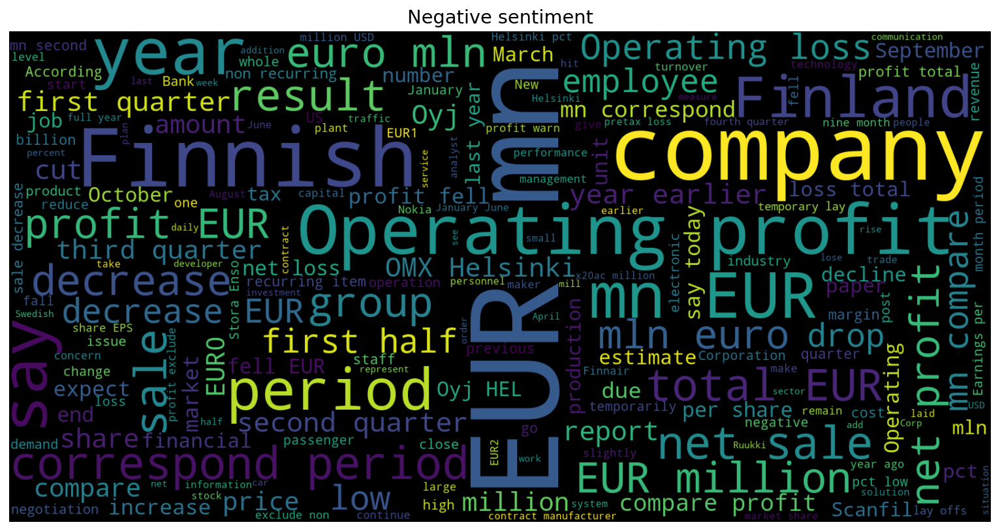

In [12]:
wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(" ".join(neg))
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Negative sentiment")
plt.axis("off")
plt.show()

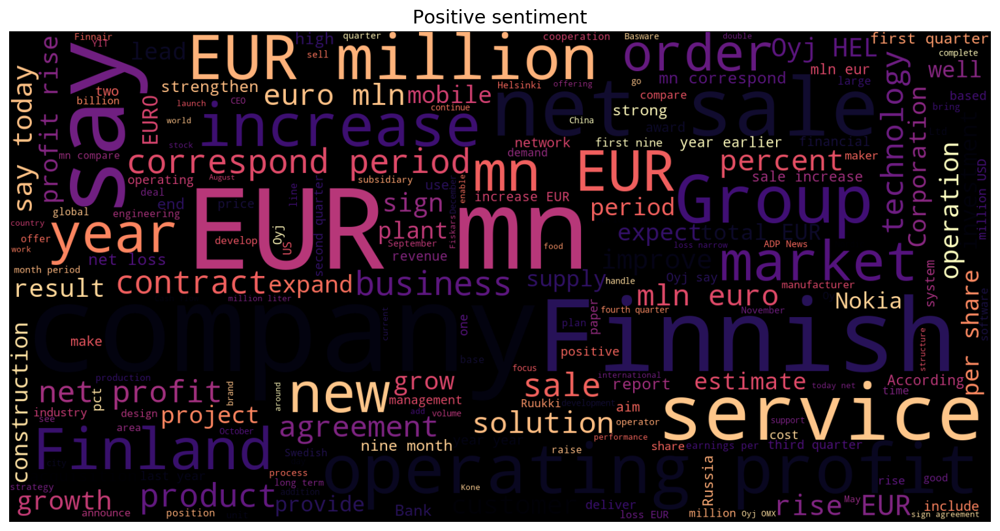

In [13]:
wordcloud = WordCloud(width=1600, height=800,max_font_size=200, colormap='magma').generate(" ".join(pos))
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Positive sentiment")
plt.axis("off")
plt.show()

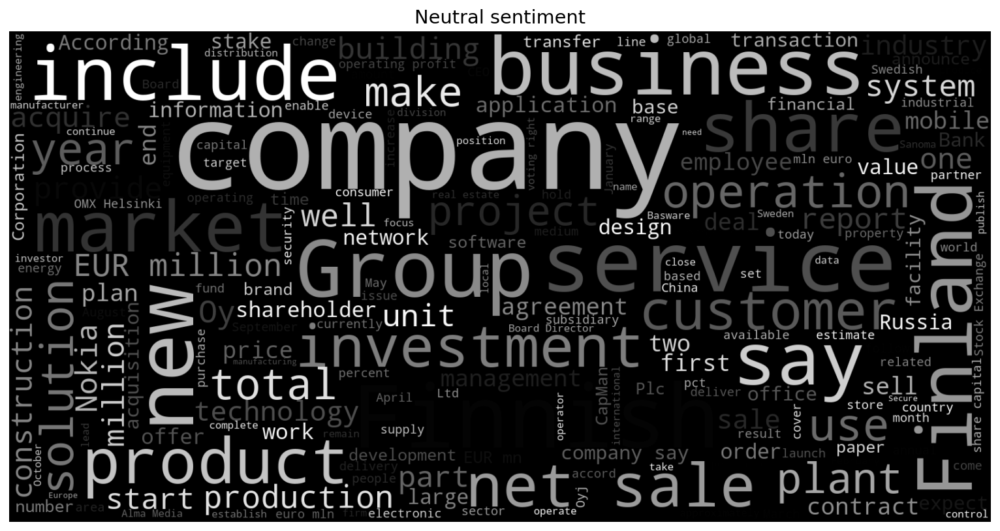

In [14]:
wordcloud = WordCloud(width=1600, height=800,max_font_size=200, colormap = 'gray').generate(" ".join(neutral))
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("Neutral sentiment")
plt.show()

In [29]:
def acc_summary(pipeline, x_train, y_train, x_test, y_test):
    t0 = time()
    sentiment_fit = pipeline.fit(x_train, y_train)
    y_pred = sentiment_fit.predict(x_test)
    train_test_time = time() - t0
    accuracy = accuracy_score(y_test, y_pred)
    print("accuracy score: {0:.2f}%".format(accuracy*100))
    print("train and test time: {0:.2f}s".format(train_test_time))
    print(" ")
    print(classification_report(y_test, y_pred))
    print(" ")
    conf = sklm.confusion_matrix(y_test, y_pred)
#   print('                 Confusion matrix')
#    print('                 Score positive    Score negative')
#    print('Actual positive    %6d' % conf[0,0] + '             %5d' % conf[0,1])
#    print('Actual negative    %6d' % conf[1,0] + '             %5d' % conf[1,1])
#    print('Actual neutral')
    print("-"*80)
    return accuracy, train_test_time


from sklearn.feature_extraction.text import TfidfVectorizer
tvec = TfidfVectorizer()

from sklearn.svm import LinearSVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.linear_model import RidgeClassifier
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.linear_model import Perceptron
from sklearn.neighbors import NearestCentroid
from sklearn.feature_selection import SelectFromModel

names = ["Linear SVC", "LinearSVC with L1-based feature selection", "Logistic Regression", "Ridge Classifier", "Multinomial NB", 
        "Bernoulli NB", "AdaBoost", "Perceptron","Passive-Aggresive", "Nearest Centroid"]
classifiers = [
        
        LinearSVC(),
        Pipeline([
            ('feature_selection', SelectFromModel(LinearSVC(penalty="l1", dual=False))),
            ('classification', LinearSVC(penalty="l2"))]),
        LogisticRegression(),
        RidgeClassifier(),
        MultinomialNB(),
        BernoulliNB(),
        AdaBoostClassifier(),
        Perceptron(),
        PassiveAggressiveClassifier(),
        NearestCentroid()
        ]
zipped_clf = zip(names,classifiers)

tvec = TfidfVectorizer()

def classifier_comparator(vectorizer=tvec, n_features=10000, stop_words=None, ngram_range=(1, 2), max_df=0.9, min_df=0,classifier=zipped_clf):
    result = []
    vectorizer.set_params(stop_words=stop_words, max_features=n_features, ngram_range=ngram_range)
    for n,c in classifier:
        checker_pipeline = Pipeline([
                            ('vectorizer', vectorizer),
                            ('classifier', c)
                            ])
        print("Validation result for {}".format(n))
       #print(c)
        clf_acc,tt_time = acc_summary(checker_pipeline, x_train, y_train, x_test, y_test)
        result.append((n,clf_acc,tt_time))
    return result
    print(result)

In [30]:
classifier_comparator(vectorizer=tvec, n_features=10000, stop_words=None, ngram_range=(1, 2), max_df=0.9, min_df=0, classifier=zipped_clf)
# max_df insures to remove most frequent words 
# ngram_range is used to select words at a time like 1 or 2 like if a sentence have 'not happy' in text then it can mean two things if we pick the word 'happy' and pick the words 'not happy' both.

Validation result for Linear SVC
accuracy score: 74.85%
train and test time: 0.28s
 
              precision    recall  f1-score   support

    negative       0.74      0.51      0.60       128
     neutral       0.78      0.87      0.82       575
    positive       0.67      0.60      0.63       267

    accuracy                           0.75       970
   macro avg       0.73      0.66      0.69       970
weighted avg       0.74      0.75      0.74       970

 
--------------------------------------------------------------------------------
Validation result for LinearSVC with L1-based feature selection
accuracy score: 75.88%
train and test time: 0.39s
 
              precision    recall  f1-score   support

    negative       0.76      0.54      0.63       128
     neutral       0.79      0.87      0.83       575
    positive       0.68      0.61      0.65       267

    accuracy                           0.76       970
   macro avg       0.74      0.68      0.70       970
weighted 

[('Linear SVC', 0.7484536082474227, 0.2837517261505127),
 ('LinearSVC with L1-based feature selection',
  0.7587628865979381,
  0.39095544815063477),
 ('Logistic Regression', 0.7422680412371134, 0.741044282913208),
 ('Ridge Classifier', 0.7556701030927835, 0.4797184467315674),
 ('Multinomial NB', 0.6969072164948453, 0.4737355709075928),
 ('Bernoulli NB', 0.6989690721649484, 0.22159767150878906),
 ('AdaBoost', 0.7206185567010309, 0.8421578407287598),
 ('Perceptron', 0.7216494845360825, 0.23939800262451172),
 ('Passive-Aggresive', 0.7195876288659794, 0.30518460273742676),
 ('Nearest Centroid', 0.6721649484536083, 0.2743065357208252)]

In [ ]:
# creating a variable for count vectorizer which gives us features using the whole text of data.
count_vec = CountVectorizer(max_features=4000, ngram_range=(1,2), max_df=0.9, min_df=0)
# max_df insures to remove most frequent words as we discussed earlier.
# ngram_range is used to select words at a time like 1 or 2 like if a sentence have 'not happy' in text then it can mean two things if we pick the word 'happy' and pick the words 'not happy' both.

In [ ]:
x_train_features = count_vec.fit_transform(x_train).todense()
x_test_features = count_vec.transform(x_test).todense()
x_train_features.shape, x_test_features.shape

lr = LogisticRegression()
lr.fit(x_train_features, y_train)
y_pred = lr.predict(x_test_features)